In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from tqdm import tqdm
%matplotlib inline
from torch.utils.data import Dataset, DataLoader
import torch
import torchvision

import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


# Generate dataset

In [2]:
y = np.random.randint(0,3,150)
idx= []
for i in range(3):
    print(i,sum(y==i))
    idx.append(y==i)

0 54
1 59
2 37


In [3]:
x = np.zeros((150,2))
# x1 = np.zeros((500,2))

In [4]:
# x[idx[0]] = np.random.uniform(low =-1,high =0,size= sum(idx[0]))
# x[idx[1]] = np.random.uniform(low =0,high =1,size= sum(idx[1]))
# x[idx[2]] = np.random.uniform(low =2,high =3,size= sum(idx[2]))
# x[idx[3],:] = np.random.normal(loc = 3)


In [5]:
x[idx[0],:] = np.random.multivariate_normal(mean =[0.5,8],cov=[[0.1,0],[0,0.1]],size=sum(idx[0]))

x[idx[1],:] = np.random.multivariate_normal(mean = [1,5.5],cov=[[0.1,0],[0,0.1]],size=sum(idx[1]))

x[idx[2],:] = np.random.multivariate_normal(mean = [3.5,7],cov=[[0.1,0],[0,0.1]],size=sum(idx[2]))


In [6]:
# x,y = np.concatenate((x,x1),axis=0),np.concatenate((y,y),axis=0)
x.shape,y.shape

((150, 2), (150,))

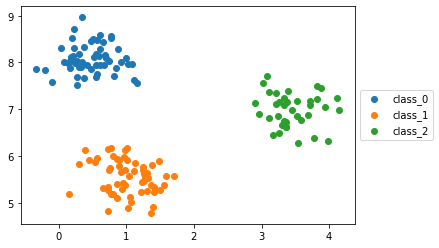

In [7]:
for i in range(3):
    #y= np.zeros(x[idx[i]].shape[0])
    plt.scatter(x[idx[i],0],x[idx[i],1],label="class_"+str(i))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [8]:
foreground_classes = {'class_0','class_1'}

background_classes = {'class_2'}

In [9]:
idx

[array([False,  True,  True,  True, False,  True, False,  True, False,
        False, False, False, False, False,  True,  True,  True, False,
        False, False, False, False, False,  True, False,  True, False,
         True,  True, False,  True, False, False,  True, False, False,
         True, False, False, False, False,  True,  True,  True, False,
        False, False, False, False, False,  True,  True,  True,  True,
        False, False, False,  True, False, False, False,  True, False,
        False, False,  True,  True, False, False, False,  True,  True,
        False,  True, False, False,  True, False, False,  True, False,
        False,  True, False,  True, False, False, False, False,  True,
         True, False,  True,  True, False, False, False, False,  True,
         True, False, False, False, False,  True, False,  True, False,
         True,  True, False,  True,  True,  True, False, False, False,
         True, False, False, False,  True, False, False, False,  True,
      

In [10]:
fg_class  = np.random.randint(0,2)
fg_idx = np.random.randint(0,3)
bg_class = 2
a = []
for i in range(3):
    if i == fg_idx:
        b = np.random.choice(np.where(idx[fg_class]==True)[0],size=1)
        a.append(x[b])
        print("foreground "+str(fg_class)+" present at " + str(fg_idx))
    else:
        
        b = np.random.choice(np.where(idx[bg_class]==True)[0],size=1)
        a.append(x[b])
        print("background "+str(bg_class)+" present at " + str(i))
a = np.concatenate(a,axis=0)
#print(a.shape)

print(fg_class , fg_idx)

foreground 1 present at 0
background 2 present at 1
background 2 present at 2
1 0


In [11]:
a

array([[0.55962843, 5.95736072],
       [3.7178452 , 7.18135153],
       [3.16492933, 6.45439943]])

In [12]:
desired_num = 1000
mosaic_list =[]
mosaic_label = []
fore_idx=[]
for j in range(desired_num):
    fg_class  = np.random.randint(0,2)
    fg_idx = np.random.randint(0,3)
    bg_class = 2
    a = []
    for i in range(3):
        if i == fg_idx:
            b = np.random.choice(np.where(idx[fg_class]==True)[0],size=1)
            a.append(x[b])
#             print("foreground "+str(fg_class)+" present at " + str(fg_idx))
        else:
            
            b = np.random.choice(np.where(idx[bg_class]==True)[0],size=1)
            a.append(x[b])
#             print("background "+str(bg_class)+" present at " + str(i))
    a = np.concatenate(a,axis=0)
    mosaic_list.append(np.reshape(a,(6,1)))
    mosaic_label.append(fg_class)
    fore_idx.append(fg_idx)

In [13]:
mosaic_list = np.concatenate(mosaic_list,axis=1).T
print(mosaic_list)

[[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663]
 [0.68514132 8.1571415  3.11013275 7.37606482 3.02473095 7.56058582]
 [3.58787902 6.76862866 0.34679155 8.97452962 3.11013275 7.37606482]
 ...
 [3.69224975 6.87560006 3.25913288 6.50043716 0.51290398 8.51050125]
 [3.25913288 6.50043716 3.25913288 6.50043716 0.38747188 6.125086  ]
 [2.90468416 7.12345118 3.33844825 7.24103634 0.56305657 7.74876393]]


In [14]:
print(np.shape(mosaic_label))
print(np.shape(fore_idx))

(1000,)
(1000,)


In [15]:
mosaic_list[:,0:2].shape

(1000, 2)

In [16]:
class MosaicDataset(Dataset):
    """MosaicDataset dataset."""
    
    
    def __init__(self, mosaic_list, mosaic_label, fore_idx):
        """
          Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.mosaic = mosaic_list
        self.label = mosaic_label
        self.fore_idx = fore_idx

    def __len__(self):
        return len(self.label)

    def __getitem__(self, idx):
        return self.mosaic[idx] , self.label[idx], self.fore_idx[idx]

batch = 250
msd = MosaicDataset(mosaic_list, mosaic_label , fore_idx)
train_loader = DataLoader( msd,batch_size= batch ,shuffle=False)

In [17]:
class Wherenet(nn.Module):
    def __init__(self):
        super(Wherenet,self).__init__()
        self.linear1 = nn.Linear(2,1)
    def forward(self,z):
        x = torch.zeros([batch,3],dtype=torch.float64)
        y = torch.zeros([batch,2], dtype=torch.float64)
        #x,y = x.to("cuda"),y.to("cuda")
        for i in range(3):
            x[:,i] = self.helper(z[:,2*i:2*i+2])[:,0]
            #print(k[:,0].shape,x[:,i].shape)
        x = F.softmax(x,dim=1)   # alphas
        #print(x.shape)
        x1 = x[:,0]
        for i in range(3):
            x1 = x[:,i]          
            y = y+torch.mul(x1[:,None],z[:,2*i:2*i+2])
        return y , x 

    
    def helper(self,x):
        x = self.linear1(x)
        #x = F.relu(self.linear2(x))
        #x = self.linear3(x)
        
        return x

    

In [18]:
for i in range(3):
    print(2*i,2*i+2)

0 2
2 4
4 6


In [19]:
trainiter = iter(train_loader)
input1,labels1,index1 = trainiter.next()



In [20]:
where = Wherenet().double()
where = where
out_avg,alphas = where(input1)
# out_avg.shape,alphas.shape

In [21]:
out_avg.shape,alphas.shape

(torch.Size([250, 2]), torch.Size([250, 3]))

In [22]:
class Whatnet(nn.Module):
    def __init__(self):
        super(Whatnet,self).__init__()
        self.linear1 = nn.Linear(2,2)
#         self.linear2 = nn.Linear(8,16)
#         self.linear3 = nn.Linear(16,3)
    def forward(self,x):
        x = self.linear1(x)
#         x = F.relu(self.linear2(x))
#         x = self.linear3(x)
        return x

In [23]:
what =Whatnet().double()
what(out_avg)

tensor([[-2.2542, -1.7224],
        [-2.4412, -1.7465],
        [-2.4469, -1.7731],
        [-2.0985, -1.6969],
        [-2.3010, -1.7162],
        [-2.3810, -1.7953],
        [-2.1420, -1.6977],
        [-2.3238, -1.7921],
        [-2.3392, -1.7268],
        [-2.3760, -1.7640],
        [-2.2939, -1.7863],
        [-2.2779, -1.7761],
        [-2.0801, -1.6888],
        [-2.1026, -1.6593],
        [-2.4300, -1.7327],
        [-2.2610, -1.7776],
        [-2.2852, -1.7968],
        [-2.1592, -1.7198],
        [-2.3848, -1.7627],
        [-2.0852, -1.7166],
        [-2.2648, -1.8065],
        [-2.2070, -1.7665],
        [-2.3221, -1.8688],
        [-2.1965, -1.7344],
        [-2.3419, -1.7662],
        [-2.2731, -1.7281],
        [-2.1109, -1.6733],
        [-2.1729, -1.6794],
        [-2.4462, -1.8314],
        [-2.4107, -1.7754],
        [-2.1864, -1.7557],
        [-2.1171, -1.6897],
        [-2.1621, -1.7515],
        [-2.3106, -1.8192],
        [-2.1642, -1.7491],
        [-2.3825, -1

In [24]:
def disp_plot(data,avg_data,true_label,pred_label,alpha,true_idx):
    plt.figure(figsize=(6,6))
    data = data.numpy()
    alpha = alpha.detach().numpy()
    avg_data = avg_data.detach().numpy()
 
    x = data[:,0:2]
    y = data[:,2:4]
    z = data[:,4:6]
    colors = ['b','g','r','c','m','y','k','teal','indigo','peru']
    
    print(data[0],avg_data[0])
    for i in range(0,10):
        plt.plot([x[i,0],y[i,0]],[x[i,1],y[i,1]],color= colors[i])#,marker ='o-')
        plt.plot([z[i,0],y[i,0]],[z[i,1],y[i,1]],color= colors[i])#,marker ='o-')
        plt.plot([x[i,0],z[i,0]],[x[i,1],z[i,1]],color= colors[i])#,marker ='o-')
#         print("dssda",avg_data[i,0],avg_data[i,1])
#         print("aaaaa",x,y,z)
        plt.plot(avg_data[i,0], avg_data[i,1],marker="x", markersize=12, color= colors[i])
        


[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.58457335 6.90332747]
[1,     4] loss: 0.739
[1,    4] accuracy: 0.442
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.58949023 6.90648265]
[2,     4] loss: 0.736
[2,    4] accuracy: 0.504
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.59384888 6.90903967]
[3,     4] loss: 0.717
[3,    4] accuracy: 0.464
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.59952894 6.91250601]
[4,     4] loss: 0.710
[4,    4] accuracy: 0.495
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.60764799 6.91782801]
[5,     4] loss: 0.704
[5,    4] accuracy: 0.504
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.61544147 6.92317982]
[6,     4] loss: 0.695
[6,    4] accuracy: 0.495
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.62304886 6.92879352]
[7,     4] loss: 0.688
[7,    4] accuracy: 0.518
[1.12445872 5

/home/dell/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[24,     4] loss: 0.141
[24,    4] accuracy: 0.997
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.72052147 7.08164119]
[25,     4] loss: 0.125
[25,    4] accuracy: 0.998
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.74574683 7.10390141]
[26,     4] loss: 0.112
[26,    4] accuracy: 0.998
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.76920209 7.12446653]
[27,     4] loss: 0.101
[27,    4] accuracy: 0.999
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.79056406 7.14314276]
[28,     4] loss: 0.092
[28,    4] accuracy: 0.999
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.80972819 7.15989824]
[29,     4] loss: 0.084
[29,    4] accuracy: 1.000
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.82670944 7.17478788]
[30,     4] loss: 0.078
[30,    4] accuracy: 1.000
[1.12445872 5.84682597 3.02473095 7.56058582 3.37627193 7.14630663] [2.84163676 7.18794622]

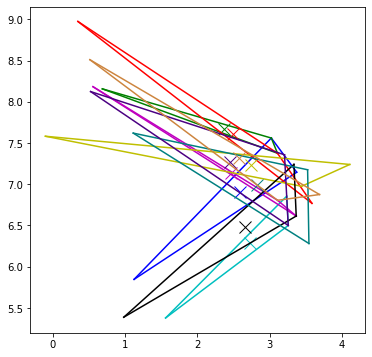

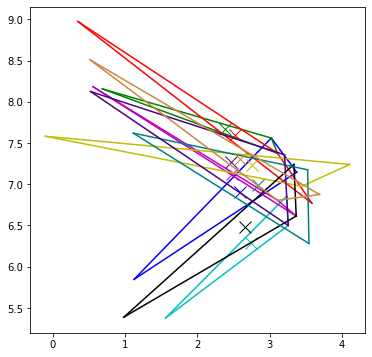

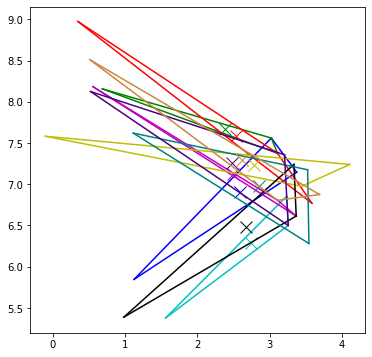

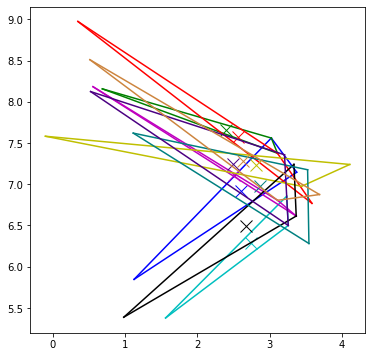

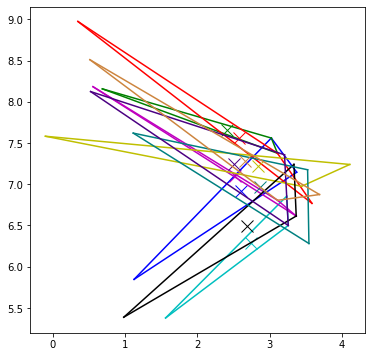

...

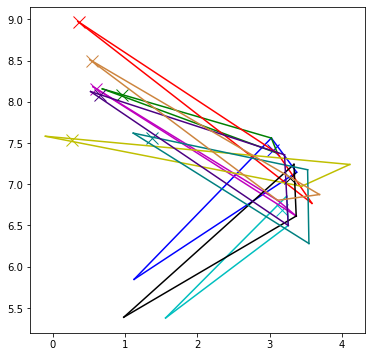

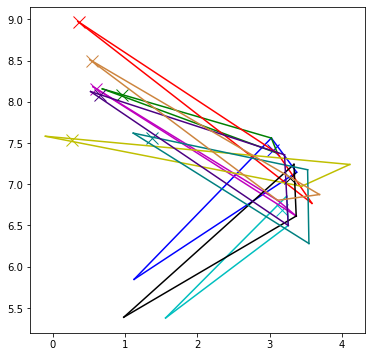

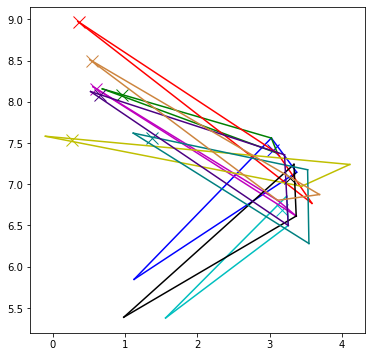

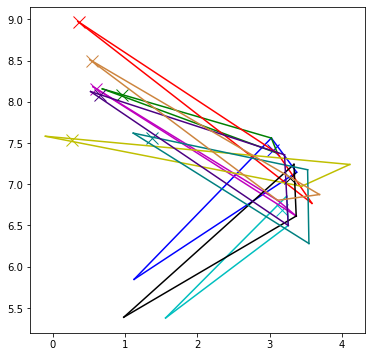

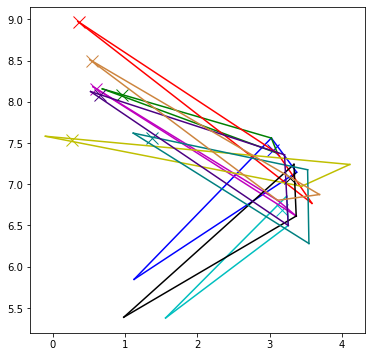

In [25]:
criterion = nn.CrossEntropyLoss()
optimizer_where = optim.SGD(where.parameters(), lr=0.01, momentum=0.9)
optimizer_what = optim.SGD(what.parameters(), lr=0.01, momentum=0.9)




nos_epochs = 300

train_loss=[]

train_acc = [] 
ig = np.random.randint(0,250)
for epoch in range(nos_epochs):  # loop over the dataset multiple times
    avg11_inp = []
    avg11_label = [] 
    running_loss = 0.0
    running_acc = 0
    cnt=0
    c = 0
    iteration = desired_num // batch
    
    for i, data in  enumerate(train_loader):
        inputs , labels , fore_idx = data
        
        optimizer_what.zero_grad()
        optimizer_where.zero_grad()
        
        avg_inp,alphas = where(inputs)
        outputs = what(avg_inp)
        
        _, predicted = torch.max(outputs.data, 1)
        
        avg11_inp.append(avg_inp.detach().numpy())
        avg11_label.append(labels)
        if(c==0):
           
            disp_plot(inputs[:10,:],avg_inp[:10],labels[:10].numpy()
                      ,predicted[:10].numpy(), avg_inp[:10,:], fore_idx[:10].numpy())
            c+=1
            
        loss = criterion(outputs, labels) 
        loss.backward() 
        
        optimizer_what.step()
        optimizer_where.step() 
        

        running_loss += loss.item()
        running_acc+=sum(predicted.cpu().numpy()== labels.cpu().numpy())
        
        if cnt % 4 == 3:    # print every 6 mini-batches
            print('[%d, %5d] loss: %.3f' %(epoch + 1, cnt + 1, running_loss/4 ))
            print('[%d,%5d] accuracy: %.3f' %(epoch + 1, cnt+1,running_acc/1000))
            
            train_loss.append(running_loss)
            train_acc.append(running_acc /1000)
            running_loss = 0.0
            running_acc = 0
            
            torch.save(where.state_dict(),"weight_elemental_2/where_model_epoch"+str(epoch)+".pt")
            torch.save(what.state_dict(),"weight_elemental_2/what_model_epoch"+str(epoch)+".pt")
        cnt=cnt+1
        
print('Finished Training')
torch.save(where.state_dict(),"weight_elemental_2/where_model_epoch"+str(nos_epochs)+".pt")
torch.save(what.state_dict(),"weight_elemental_2/what_model_epoch"+str(epoch)+".pt")       
        
        
        

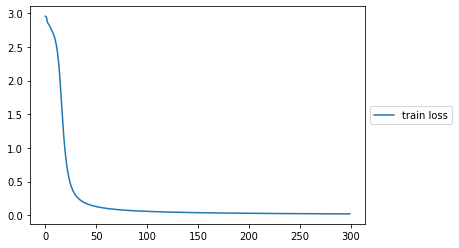

In [26]:
plt.plot(train_loss,label = "train loss")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

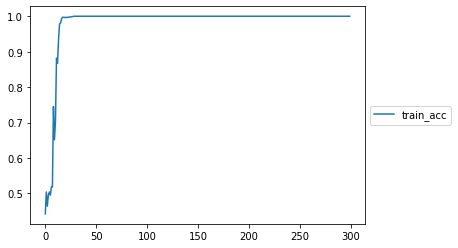

In [27]:
plt.plot(train_acc,label ="train_acc")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [28]:
avg11_inp

[array([[ 3.05097801,  7.41582804],
        [ 0.95088973,  8.08243992],
        [ 0.36568859,  8.96325664],
        [ 3.17379329,  6.69334468],
        [ 0.59867696,  8.1596991 ],
        [ 0.26322808,  7.54016181],
        [ 3.27898938,  7.08162828],
        [ 1.3745683 ,  7.56246639],
        [ 0.64941813,  8.08376439],
        [ 0.5385184 ,  8.49560173],
        [ 0.94804702,  8.00033716],
        [ 3.09399149,  7.4332384 ],
        [ 2.81996769,  6.27983334],
        [ 2.29777491,  6.39503524],
        [ 0.68525101,  7.93410334],
        [ 3.29640198,  7.63904533],
        [ 3.31586602,  7.1039267 ],
        [ 3.12761196,  6.82360045],
        [ 0.80974425,  8.54587661],
        [ 3.45874503,  6.84241118],
        [ 3.56220228,  7.03104903],
        [ 3.41100664,  7.00500336],
        [ 3.8790716 ,  7.3128683 ],
        [ 3.34374632,  6.90236413],
        [ 0.77191963,  8.06146554],
        [ 0.79402619,  7.99570514],
        [ 3.06375934,  6.69012876],
        [ 2.95762308,  6.991